# 10x PAGET

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr
import doubletdetection
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
warnings.filterwarnings('ignore')

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()

/home/lebrigand/.conda/envs/jupyter/lib/python3.7/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


scanpy==1.4.4.post1 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.3 scipy==1.3.3 pandas==0.25.3 scikit-learn==0.21.3 statsmodels==0.10.2 python-igraph==0.7.1 louvain==0.6.1


In [2]:
sc.settings.set_figure_params(dpi=130)

# wt
[Back to top](#wt)

In [3]:
wt = sc.read_h5ad('./output/wt.preprocessing.h5ad')
wt.shape

(3290, 12958)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


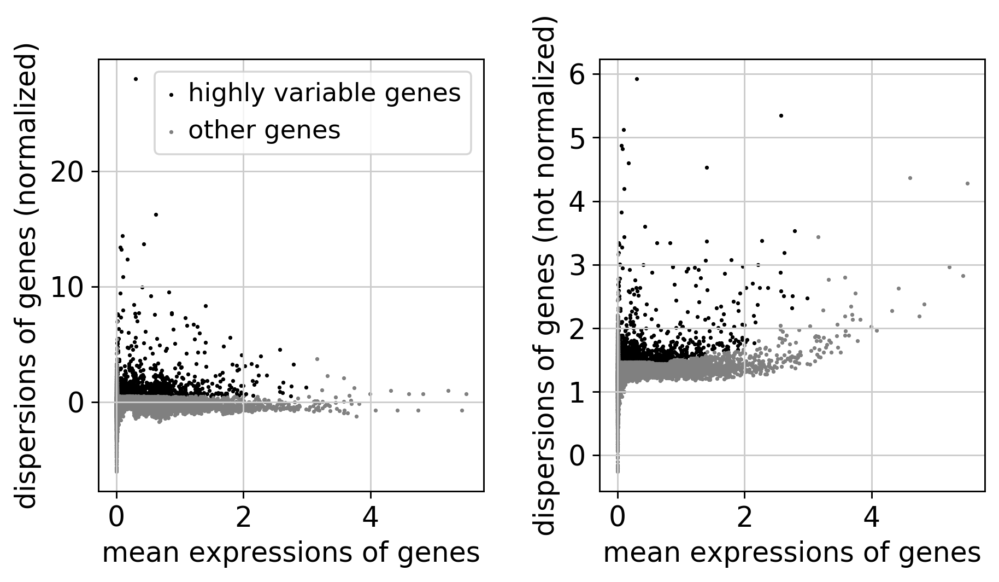

1807

In [4]:
#hvgs = adata_ko.var['highly_variable'].intersection(adata_wt.var['highly_variable'])
sc.pp.highly_variable_genes(wt, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(wt)
np.sum(wt.var['highly_variable'])

In [5]:
#wt = wt[:, wt.var['highly_variable']]

In [6]:
#sc.pp.regress_out(wt, ['n_counts'])

In [7]:
sc.pp.scale(wt, max_value=10)

In [8]:
sc.tl.pca(wt, svd_solver='arpack')

computing PCA with n_comps = 50
computing PCA on highly variable genes
    finished (0:00:00)


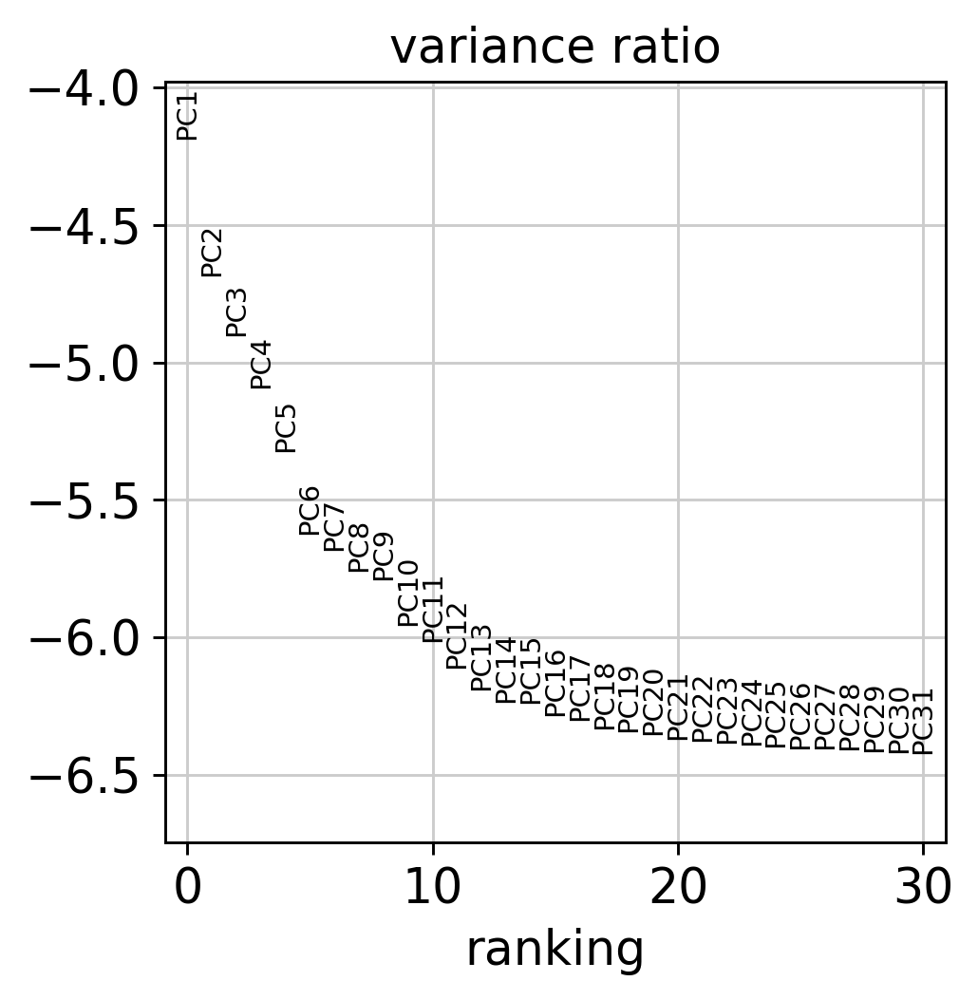

In [9]:
sc.pl.pca_variance_ratio(wt, log=True)

In [10]:
sc.pp.neighbors(wt)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:02)


In [11]:
sc.tl.umap(wt)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)


running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 12 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


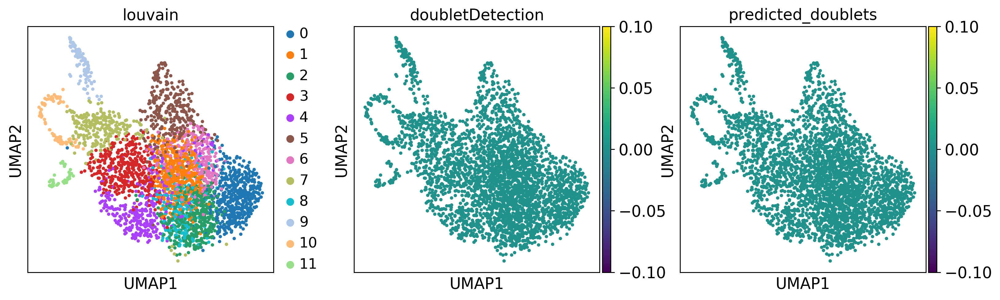

In [12]:
sc.tl.louvain(wt, resolution=1.5)
sc.pl.umap(wt, color=['louvain',"doubletDetection",'predicted_doublets'])

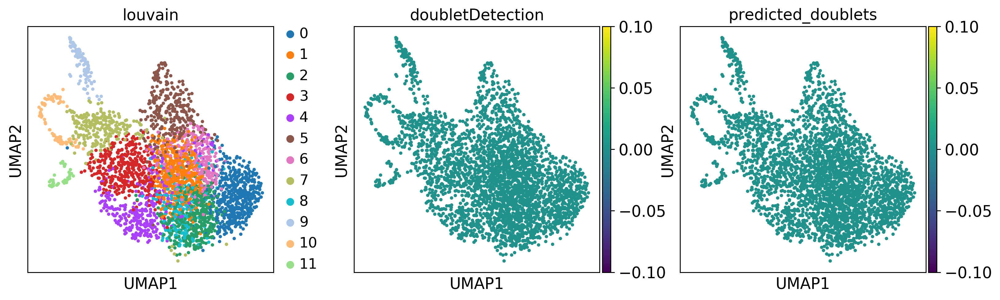

In [13]:
sc.pl.umap(wt, color=['louvain','doubletDetection','predicted_doublets'])

In [14]:
mean_cellType = np.empty((len(wt.obs['louvain'].unique()), wt.raw.shape[1]), 
                           dtype=float, order='C')

In [15]:
raw_adata = wt.raw.X.toarray()

In [16]:
for i in range(0, len(wt.obs['louvain'].unique())):
    #print(adata.obs['phenograph'].unique()[i])
    mean_cellType[i,:] = np.mean(raw_adata[wt.obs['louvain'] == wt.obs['louvain'].unique()[i], :], axis = 0)

In [17]:
mean_df = pd.DataFrame(np.corrcoef(mean_cellType), index = wt.obs['louvain'].unique(), columns = wt.obs['louvain'].unique())

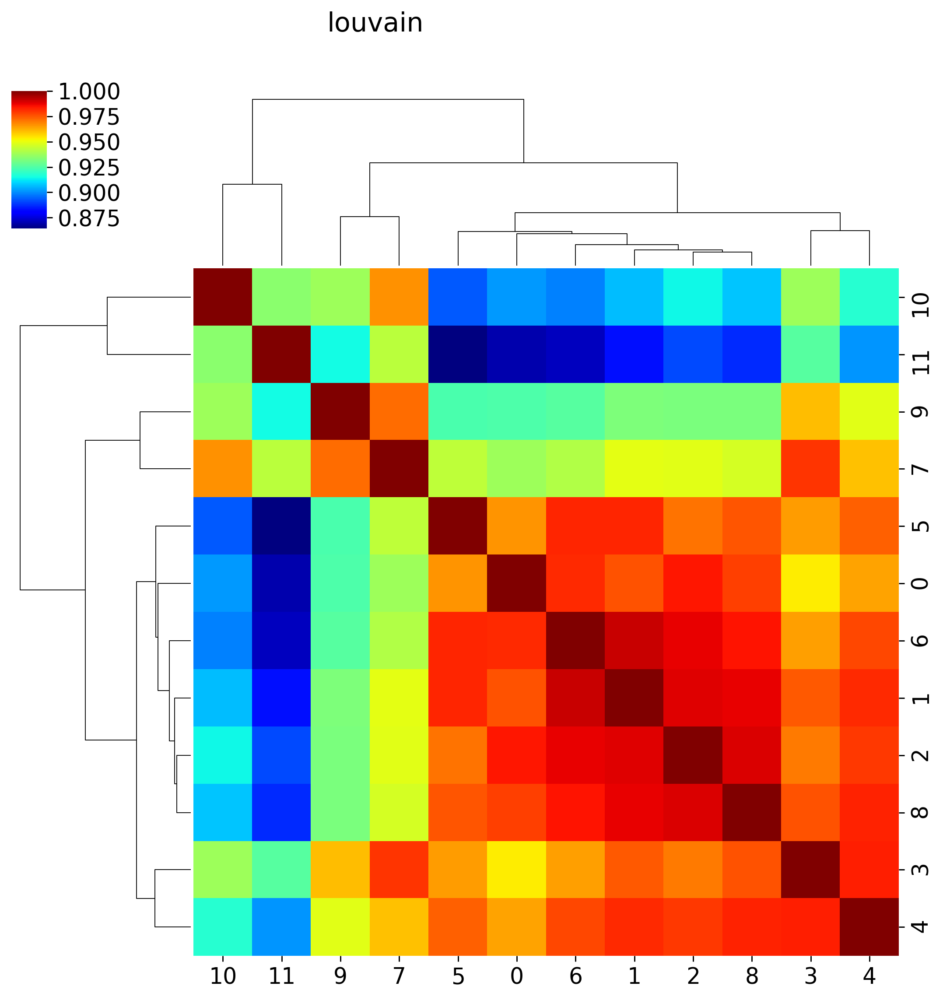

In [18]:
import seaborn
ax = seaborn.clustermap(mean_df, cmap="jet").fig.suptitle('louvain') 

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:04)


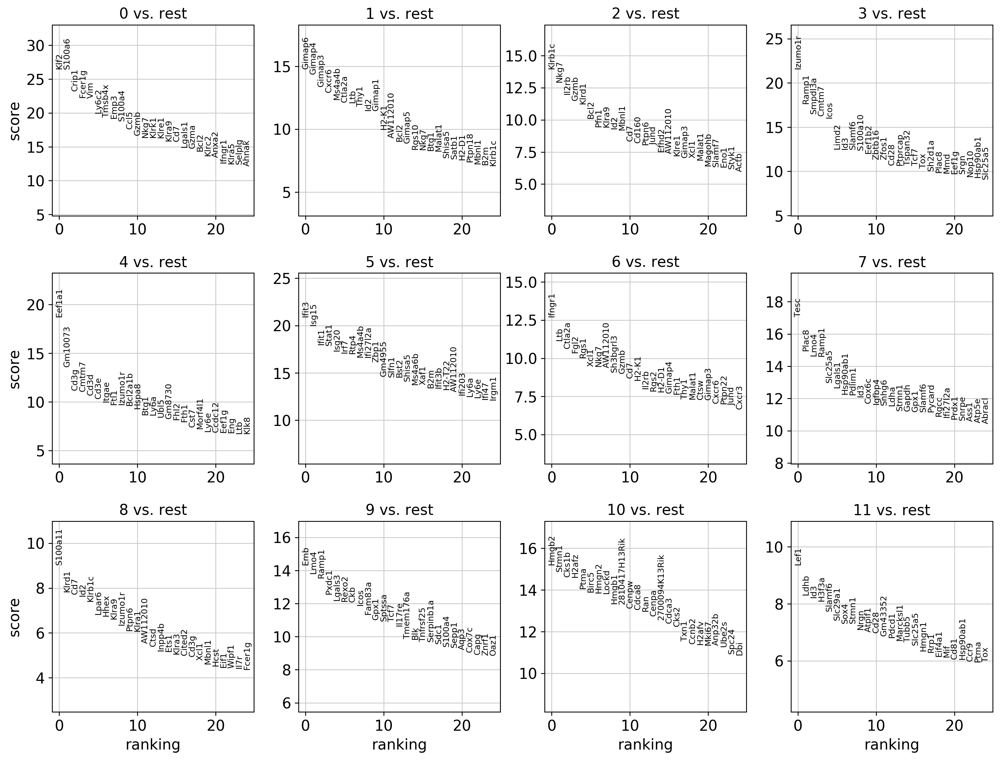

In [19]:
sc.tl.rank_genes_groups(wt, 'louvain', method='wilcoxon')
sc.pl.rank_genes_groups(wt, n_genes=25, sharey=False)

In [20]:
pd.DataFrame(wt.uns['rank_genes_groups']['names']).head(10)

,0,1,2,3,4,5,6,7,8,9,10,11
0,Klf2,Gimap6,Klrb1c,Izumo1r,Eef1a1,Ifit3,Ifngr1,Tesc,S100a11,Emb,Hmgb2,Lef1
1,S100a6,Gimap4,Nkg7,Ramp1,Gm10073,Isg15,Ltb,Plac8,Klrd1,Lmo4,Stmn1,Ldhb
2,Crip1,Gimap3,Il2rb,Smpdl3a,Cd3g,Ifit1,Ctla2a,Lmo4,Cd7,Ramp1,Cks1b,Id3
3,Fcer1g,Cxcr6,Gzmb,Cmtm7,Cmtm7,Stat1,Fgl2,Ramp1,Id2,Pxdc1,H2afz,H3f3a
4,Vim,Ms4a4b,Klrd1,Icos,Cd3d,Isg20,Rgs1,Slc25a5,Klrb1c,Lgals3,Ptma,Slamf6
5,Ly6c2,Ctla2a,Bcl2,Limd2,Cd3e,Irf7,Xcl1,Lgals1,Lpar6,Rexo2,Birc5,Slc29a1
6,Tmsb4x,Ltb,Pfn1,Id3,Itgae,Rtp4,Nkg7,Hsp90ab1,Hhex,Ckb,Hmgn2,Sox4
7,Emp3,Thy1,Klra9,Slamf6,Ftl1,Ms4a4b,AW112010,Pdlim1,Klra9,Icos,Lockd,Stmn1
8,S100a4,Id2,Id2,S100a10,Izumo1r,Ifi27l2a,Sh3bgrl3,Id3,Izumo1r,Fam83a,Hmgb1,Nrgn
9,Ccl5,Gimap1,Mbnl1,Eef1b2,Bcl2a1b,Zbp1,Gzmb,Cox6c,Ptpn6,Gpx1,2810417H13Rik,Atpif1


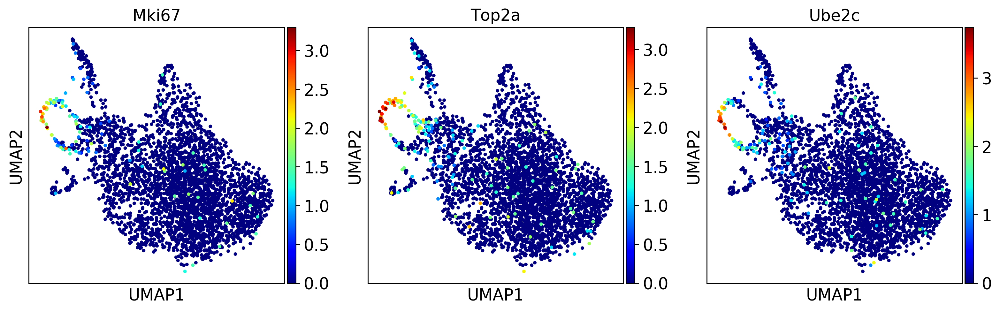

In [21]:
sc.pl.umap(wt, color=['Mki67', 'Top2a', 'Ube2c'], color_map="jet") # Cycling

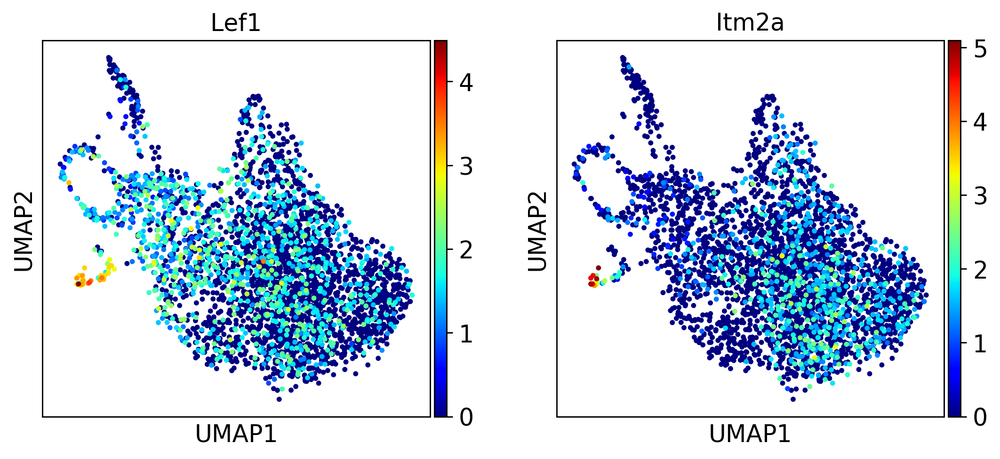

In [22]:
sc.pl.umap(wt, color=['Lef1','Itm2a'], color_map="jet") # NKT0

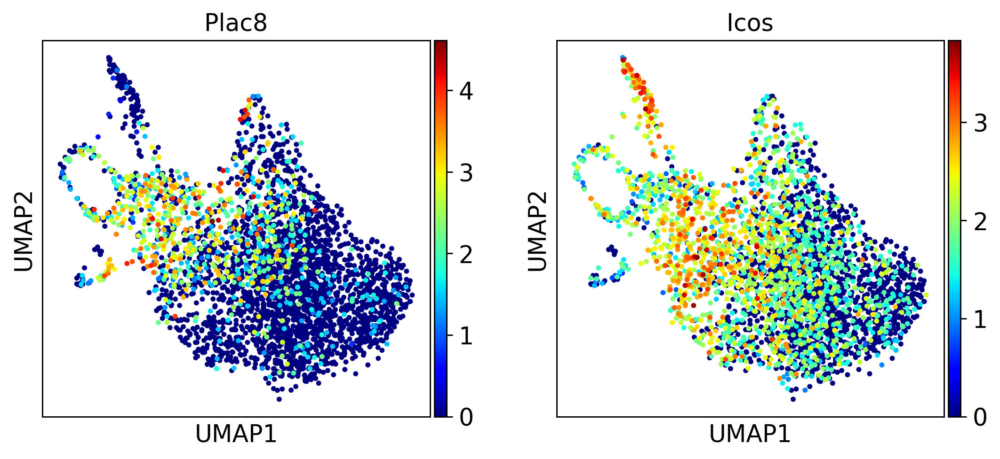

In [23]:
sc.pl.umap(wt, color=['Plac8','Icos'], color_map="jet") # NKT2

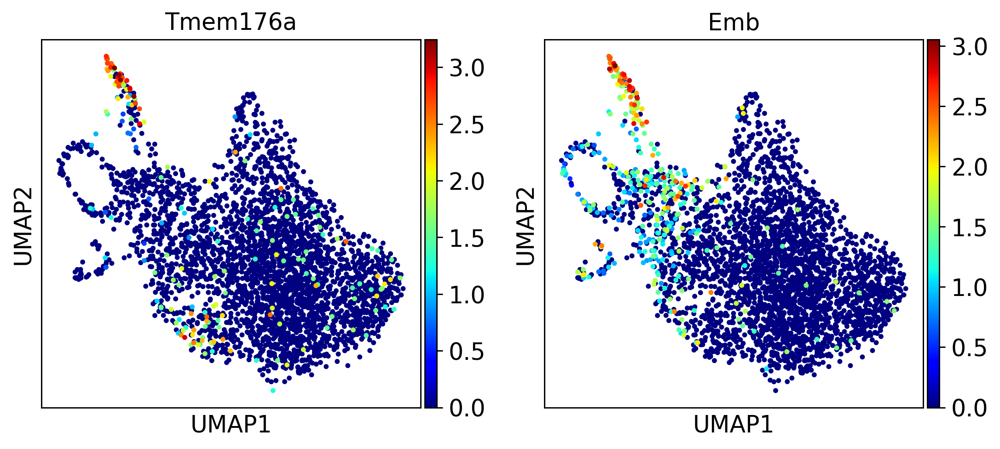

In [24]:
sc.pl.umap(wt, color=['Tmem176a','Emb'], color_map="jet") # NKT17

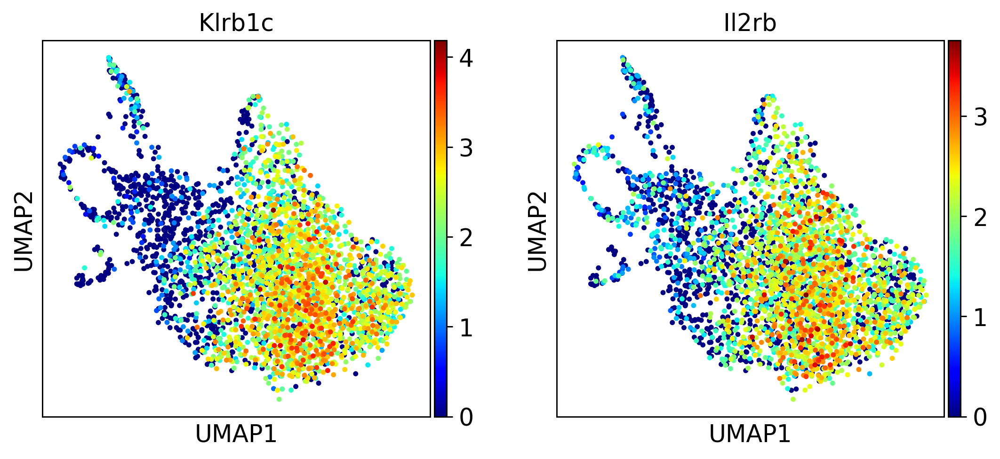

In [25]:
sc.pl.umap(wt, color=['Klrb1c','Il2rb'], color_map="jet") # NKT1

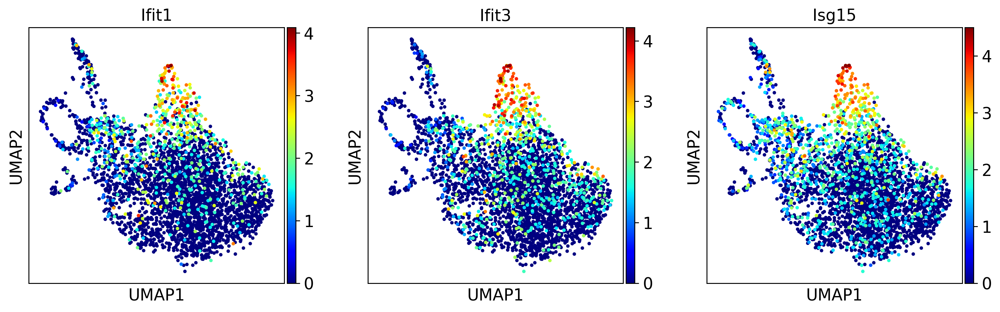

In [26]:
sc.pl.umap(wt, color=['Ifit1','Ifit3','Isg15'], color_map="jet") # NKT1d

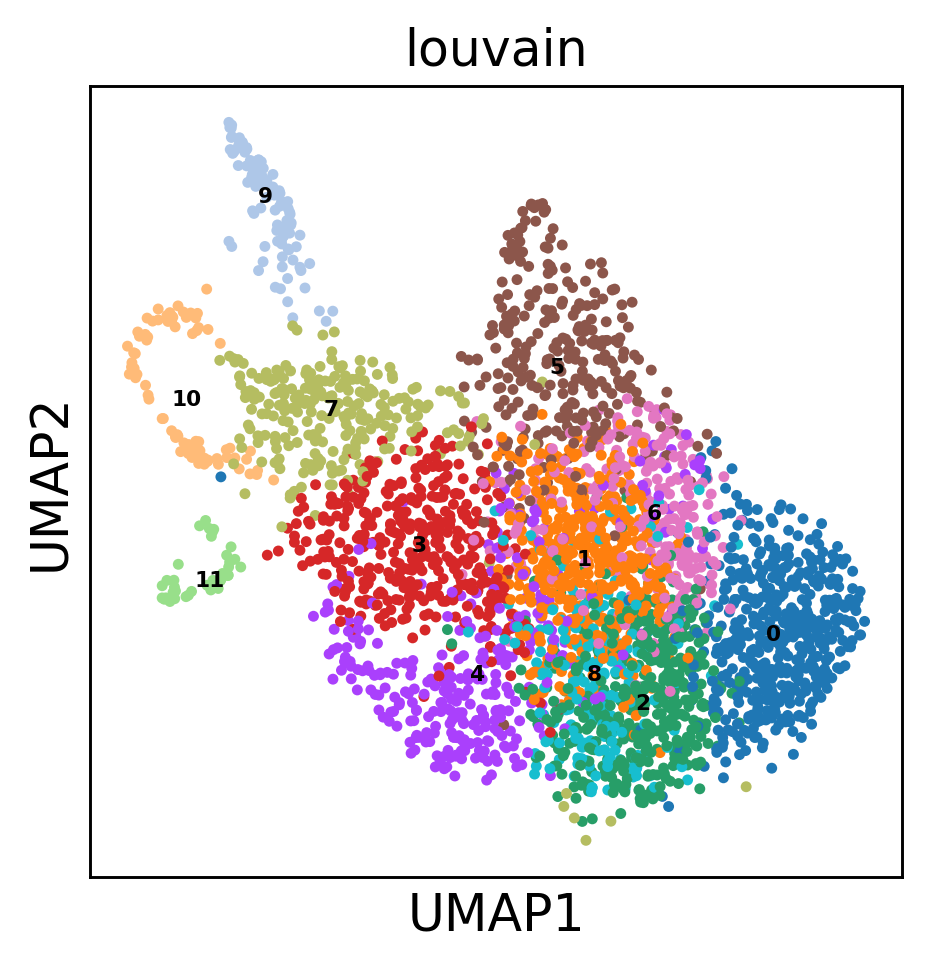

In [27]:
sc.pl.umap(wt, color=['louvain'], legend_loc = 'on data', legend_fontsize = 6)

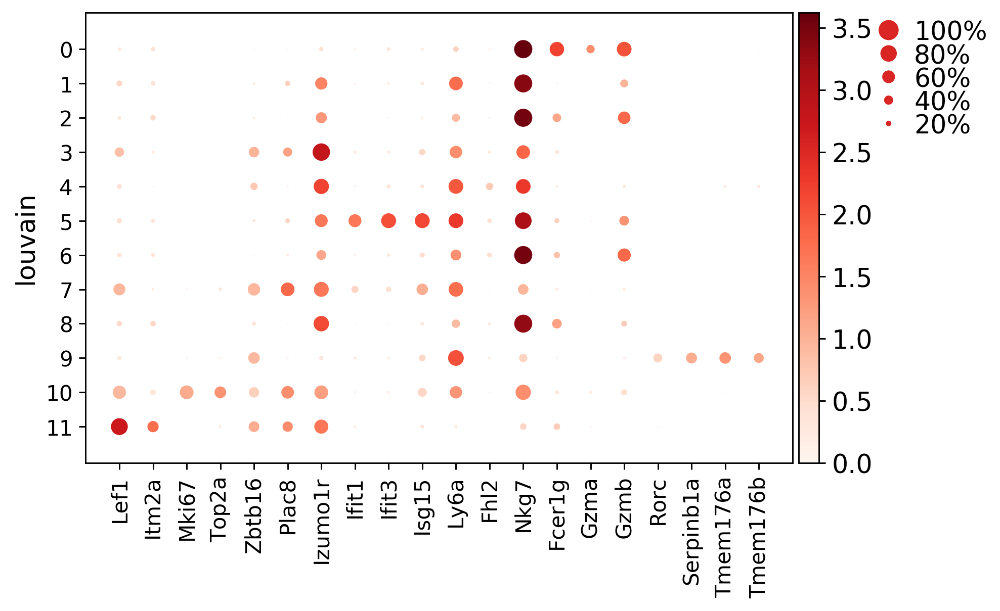

In [28]:
marker_genes = ['Lef1','Itm2a','Mki67','Top2a','Zbtb16','Plac8','Izumo1r','Ifit1','Ifit3','Isg15','Ly6a','Fhl2','Nkg7','Fcer1g','Gzma','Gzmb','Rorc','Serpinb1a','Tmem176a','Tmem176b']
ax = sc.pl.dotplot(wt, marker_genes, groupby='louvain')

In [29]:
new_cluster_names = {
    '0':'NKT1c', '1':'NKT1b', '2':'NKT1b', '3':'NKT2b', '4':'NKT1a',
    '5':'NKT1d','6':'NKT1b', '7':'NKT2a', '8':'NKT1b', '9':'NKT17',
    '10':'Cycling NKT', '11':'NKT0'}

In [30]:
vect = []
for i in range(0, len(wt.obs['louvain'])):
    vect = vect + [new_cluster_names[str(wt.obs['louvain'][i])]]
    
wt.obs['cell_type'] = vect

# or
#adata.obs['louvain'].cat.categories
#adata.rename_categories('louvain', ['TA', 'EP (early)', 'Stem', 'Goblet', 'EP (stress)', 'Enterocyte', 'Paneth', 'Enteroendocrine', 'Tuft'])
#adata.obs['louvain'].value_counts()



... storing 'cell_type' as categorical


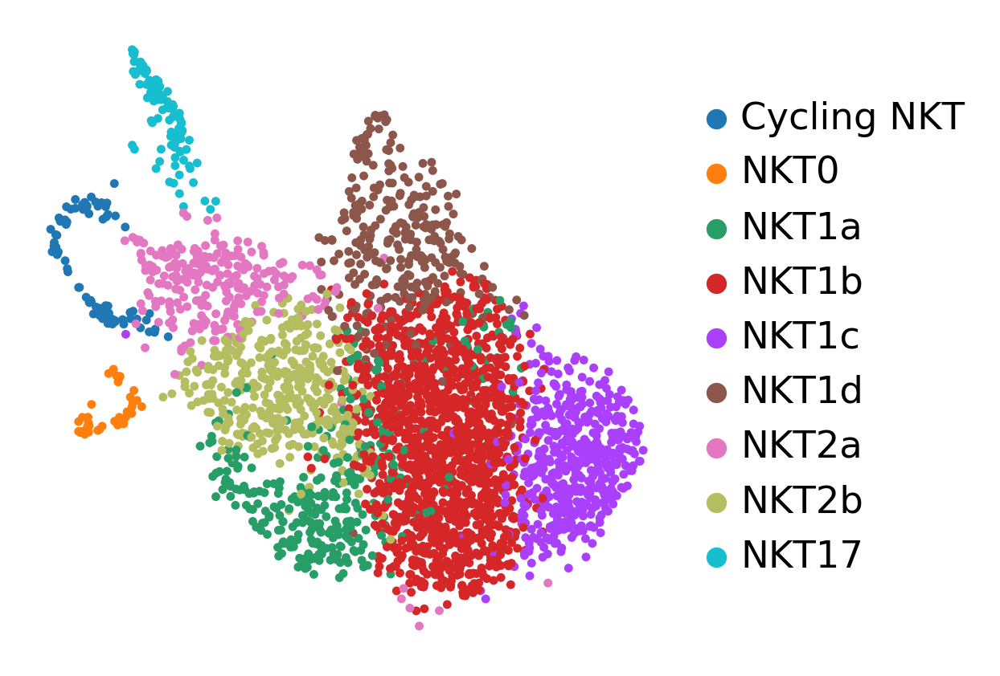

In [31]:
sc.pl.umap(wt, color='cell_type', title='', frameon=False)

In [32]:
wt.obs['cell_type'].cat.categories
wt.obs['cell_type'].cat.reorder_categories(['NKT0','Cycling NKT','NKT17','NKT2a','NKT2b','NKT1a','NKT1b','NKT1c','NKT1d'], inplace = True)
wt.uns['cell_type_colors'] = [ '#A31E22', # NKT0
                                '#F3766E', # Cycling NKT 
                                '#2da9d2', # NKT17
                                '#FEC85A', # NKT2a
                                '#FAE600', # NKT2b
                                '#50C878', # NKT1a
                                '#2E8B57', # NKT1b
                                '#0B6623', # NKT1c
                                '#4CBB17'] # NKT1d

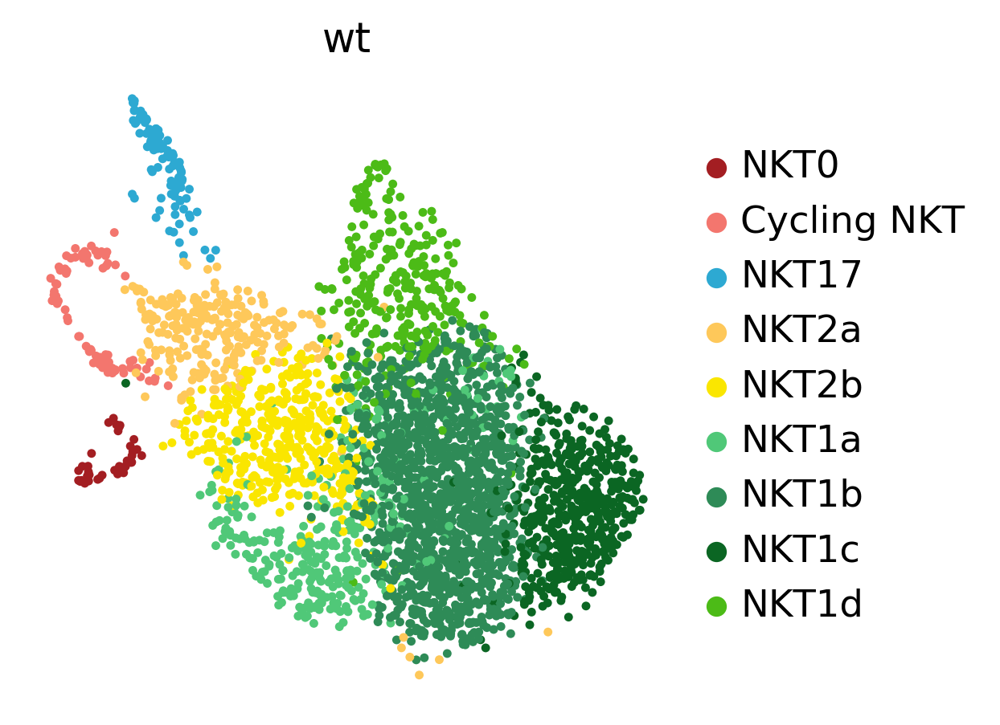

In [33]:
sc.pl.umap(wt, color='cell_type', title='wt', frameon=False)

In [34]:
wt.obs.groupby(["cell_type"]).apply(len)

cell_type
NKT0             39
Cycling NKT      81
NKT17            92
NKT2a           245
NKT2b           405
NKT1a           324
NKT1b          1315
NKT1c           488
NKT1d           301
dtype: int64

In [35]:
wt.shape

(3290, 12958)

# Gene markers

In [36]:
sc.tl.rank_genes_groups(wt, 'cell_type', method='wilcoxon', n_genes=200)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:04)


In [37]:
pd.DataFrame(wt.uns['rank_genes_groups']['names']).head(10)

,NKT0,Cycling NKT,NKT17,NKT2a,NKT2b,NKT1a,NKT1b,NKT1c,NKT1d
0,Lef1,Hmgb2,Emb,Tesc,Izumo1r,Eef1a1,Nkg7,Klf2,Ifit3
1,Ldhb,Stmn1,Lmo4,Plac8,Ramp1,Gm10073,Klrb1c,S100a6,Isg15
2,Id3,Cks1b,Ramp1,Lmo4,Smpdl3a,Cd3g,Id2,Crip1,Ifit1
3,H3f3a,H2afz,Pxdc1,Ramp1,Cmtm7,Cmtm7,AW112010,Fcer1g,Stat1
4,Slamf6,Ptma,Lgals3,Slc25a5,Icos,Cd3d,Il2rb,Vim,Isg20
5,Slc29a1,Birc5,Rexo2,Lgals1,Limd2,Cd3e,Gimap4,Ly6c2,Irf7
6,Sox4,Hmgn2,Ckb,Hsp90ab1,Id3,Itgae,Gimap3,Tmsb4x,Rtp4
7,Stmn1,Lockd,Icos,Pdlim1,Slamf6,Ftl1,Ctla2a,Emp3,Ms4a4b
8,Nrgn,Hmgb1,Fam83a,Id3,S100a10,Izumo1r,Klrd1,S100a4,Ifi27l2a
9,Atpif1,2810417H13Rik,Gpx1,Cox6c,Eef1b2,Bcl2a1b,Gimap6,Ccl5,Zbp1


In [38]:
cell_type_nb = {}
list_cell_type = wt.obs['cell_type'].unique().tolist()
list_cell_type.sort()
for i in range(0, len(wt.obs['cell_type'].unique().tolist())):
    cell_type_nb[list_cell_type[i]] = i

#inverted_cell_type_nb = dict([[v,k] for k,v in cell_type_nb.items()])
#inverted_cell_type_nb

In [39]:
clusters = []
genes = []
logFC = []
score = []
pvals = []
pvals_adj = []

for cl in cell_type_nb.keys():
    clusters = clusters + ([cl]*len(wt.uns['rank_genes_groups']['names'][str(cl)]))
    genes = genes + wt.uns['rank_genes_groups']['names'][str(cl)].tolist()
    logFC = logFC + wt.uns['rank_genes_groups']['logfoldchanges'][str(cl)].tolist()
    score = score + wt.uns['rank_genes_groups']['scores'][str(cl)].tolist()
    pvals = pvals + wt.uns['rank_genes_groups']['pvals'][str(cl)].tolist()
    pvals_adj = pvals_adj + wt.uns['rank_genes_groups']['pvals_adj'][str(cl)].tolist()
    

In [40]:
markers = pd.DataFrame(data = {'clusters': clusters,
                              'genes':genes,
                              'logFC':logFC,
                              'score':score,
                              'pvals':pvals,
                              'pvals_adj':pvals_adj,
                              })

In [41]:
markers.to_csv(path_or_buf = 'wt.markers.csv', sep = ',', index = False)

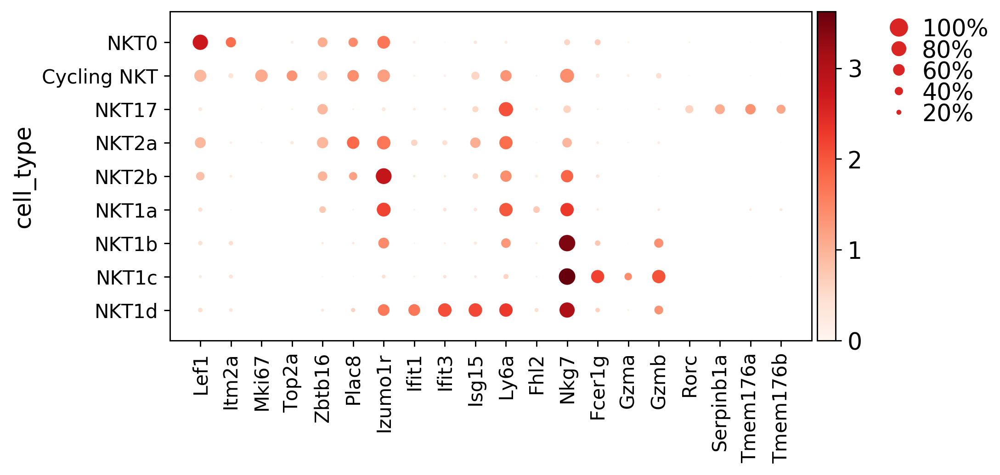

In [42]:
marker_genes = ['Lef1','Itm2a','Mki67','Top2a','Zbtb16','Plac8','Izumo1r','Ifit1','Ifit3','Isg15','Ly6a','Fhl2','Nkg7','Fcer1g','Gzma','Gzmb','Rorc','Serpinb1a','Tmem176a','Tmem176b']
ax = sc.pl.dotplot(wt, marker_genes, groupby='cell_type')

# Transcription factor dotplot

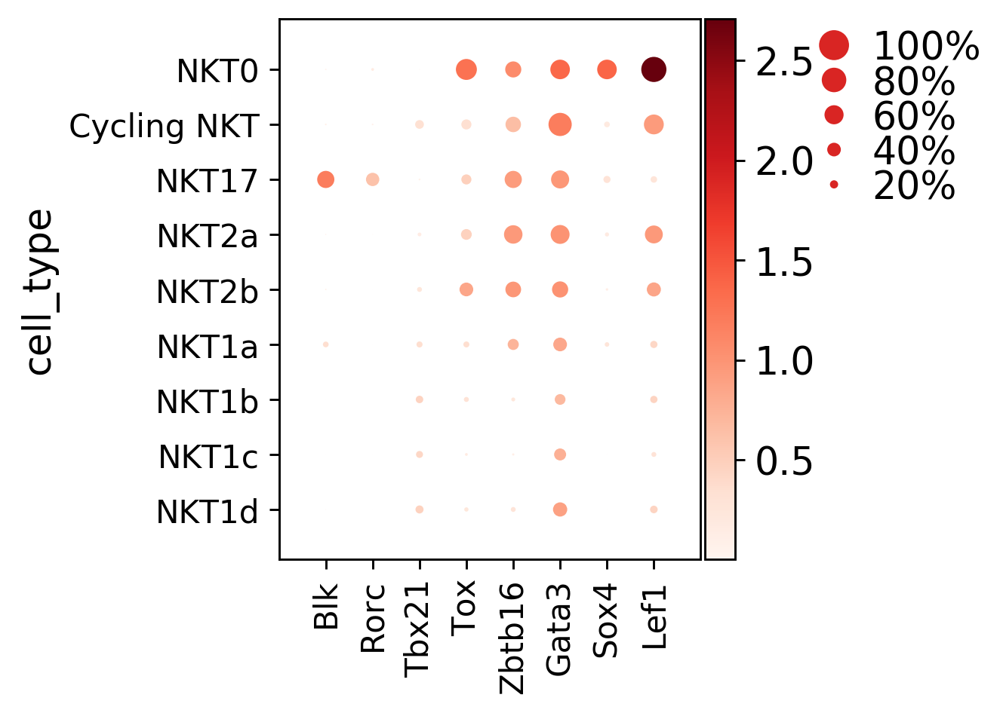

In [43]:
marker_genes = ['Blk', 'Rorc', 'Tbx21', 'Tox', 'Zbtb16', 'Gata3', 'Sox4','Lef1']
ax = sc.pl.dotplot(wt, marker_genes, groupby='cell_type', save='fig.1h.pdf')

#sc.pl.matrixplot(wt, marker_genes, groupby='cell_type', dendrogram=True,
#                      use_raw=False, vmin=-3, vmax=3, cmap='bwr',  swap_axes=True, figsize=(5,6))


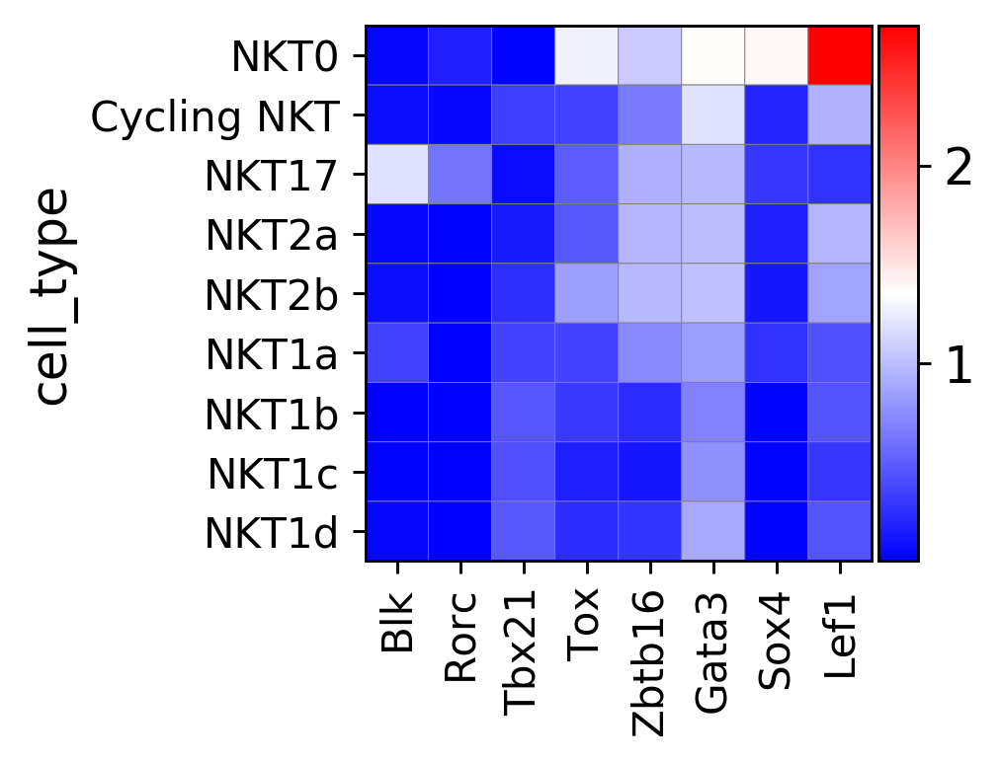

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[2.56, 0, 0.2])

In [44]:
sc.pl.matrixplot(wt, marker_genes, groupby='cell_type', cmap='bwr')

# Saving cellbrowser

In [45]:
wt.write('./output/wt.ann.h5ad')

In [46]:
wt.obs['umap_1'] = pd.DataFrame(wt.obsm['X_umap']).iloc[:,0].tolist()
wt.obs['umap_2'] = pd.DataFrame(wt.obsm['X_umap']).iloc[:,1].tolist()
wt.obs.to_csv(path_or_buf = 'output/metadata.wt.tsv', sep = '\t', index = True)

sc.external.exporting.cellbrowser(wt, 
                                 'cellbrowser/wt', 
                                 'wt', 
                                  annot_keys=['cell_type', 'louvain', 'sample', 
                                              'n_counts', 'n_genes', 'percent_mito', 'percent_ribo'], 
                                 cluster_field='cell_type', nb_marker=30,
                                 skip_matrix=False, do_debug=True)

INFO:root:Writing scanpy matrix (3290 cells, 12958 genes) to cellbrowser/wt/exprMatrix.tsv.gz
INFO:root:Transposing matrix
INFO:root:Writing gene-by-gene, without using pandas
INFO:root:Writing 12958 genes in total
INFO:root:Wrote 0 genes
INFO:root:Wrote 2000 genes
INFO:root:Wrote 4000 genes
INFO:root:Wrote 6000 genes
INFO:root:Wrote 8000 genes
INFO:root:Wrote 10000 genes
INFO:root:Wrote 12000 genes
DEBUG:root:Compressing cellbrowser/wt/exprMatrix.tsv.gz.tmp
DEBUG:root:Running gzip -f cellbrowser/wt/exprMatrix.tsv.gz.tmp
DEBUG:root:Renaming cellbrowser/wt/exprMatrix.tsv.gz.tmp.gz to cellbrowser/wt/exprMatrix.tsv.gz
DEBUG:root:Couldnt find coordinates for ForceAtlas2, tried keys fa, X_fa and X_draw_graph_fa
DEBUG:root:Couldnt find coordinates for Fruchterman Reingold, tried keys fr, X_fr and X_draw_graph_fr
DEBUG:root:Couldnt find coordinates for Grid Fruchterman Reingold, tried keys grid_fr, X_grid_fr and X_draw_graph_grid_fr
DEBUG:root:Couldnt find coordinates for Kamadi Kawai, tried 

# Remove Cycling and NKT1d

In [47]:
cell_bool = []
for x in wt.obs['cell_type']:
    cell_bool = cell_bool + [x in ['NKT0','NKT17','NKT2a','NKT2b','NKT1a','NKT1b','NKT1c']]

In [48]:
list_of_cell_names = wt.obs.loc[cell_bool, :].index.tolist()
wt = wt[list_of_cell_names, ]
wt.shape

(2908, 12958)

# Gatting dotplot

DEBUG:matplotlib.colorbar:locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f81e3489fd0>
DEBUG:matplotlib.colorbar:Using auto colorbar locator on colorbar
DEBUG:matplotlib.colorbar:locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f81e3489fd0>
DEBUG:matplotlib.colorbar:Setting pcolormesh


DEBUG:matplotlib.backends.backend_pdf:Assigning font /b'F1' = '/home/lebrigand/.conda/envs/jupyter/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf'
DEBUG:matplotlib.backends.backend_pdf:Embedding font /home/lebrigand/.conda/envs/jupyter/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf.
DEBUG:matplotlib.backends.backend_pdf:Writing TrueType font.
DEBUG:matplotlib.backends.backend_pdf:Assigning font /b'F1' = '/home/lebrigand/.conda/envs/jupyter/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf'
DEBUG:matplotlib.backends.backend_pdf:Embedding font /home/lebrigand/.conda/envs/jupyter/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf.
DEBUG:matplotlib.backends.backend_pdf:Writing TrueType font.


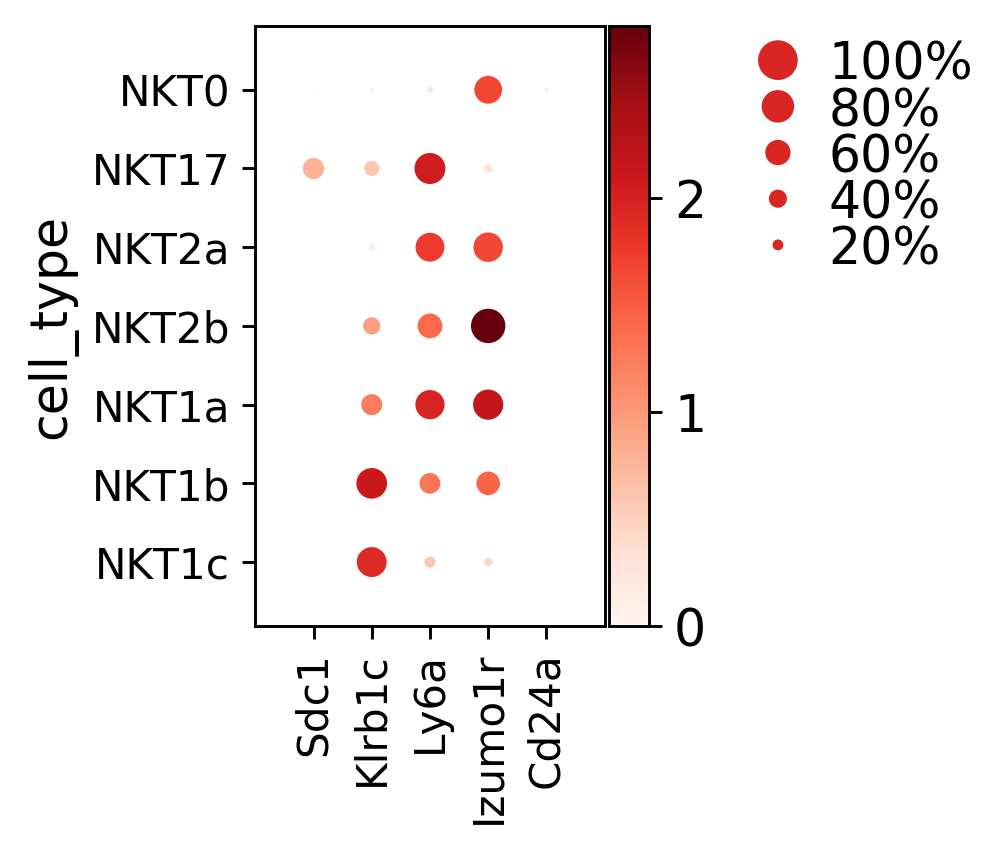

In [49]:
marker_genes = ['Sdc1', 'Klrb1c', 'Ly6a', 'Izumo1r','Cd24a']
ax = sc.pl.dotplot(wt, marker_genes, groupby='cell_type', save='fig.5a.pdf')

# thymus egress dotplot

In [50]:
wt = sc.read_h5ad('./output/wt.ann.h5ad')

In [51]:
cell_bool = []
for x in wt.obs['cell_type']:
    cell_bool = cell_bool + [x in ['NKT0','NKT17','NKT2a','NKT2b','NKT1a','NKT1b','NKT1c']]

In [52]:
list_of_cell_names = wt.obs.loc[cell_bool, :].index.tolist()
wt = wt[list_of_cell_names, ]
wt.shape

(2908, 12958)

DEBUG:matplotlib.colorbar:locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f81dbc20590>
DEBUG:matplotlib.colorbar:Using auto colorbar locator on colorbar
DEBUG:matplotlib.colorbar:locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f81dbc20590>
DEBUG:matplotlib.colorbar:Setting pcolormesh


DEBUG:matplotlib.backends.backend_pdf:Assigning font /b'F1' = '/home/lebrigand/.conda/envs/jupyter/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf'
DEBUG:matplotlib.backends.backend_pdf:Embedding font /home/lebrigand/.conda/envs/jupyter/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf.
DEBUG:matplotlib.backends.backend_pdf:Writing TrueType font.
DEBUG:matplotlib.backends.backend_pdf:Assigning font /b'F1' = '/home/lebrigand/.conda/envs/jupyter/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf'
DEBUG:matplotlib.backends.backend_pdf:Embedding font /home/lebrigand/.conda/envs/jupyter/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf.
DEBUG:matplotlib.backends.backend_pdf:Writing TrueType font.


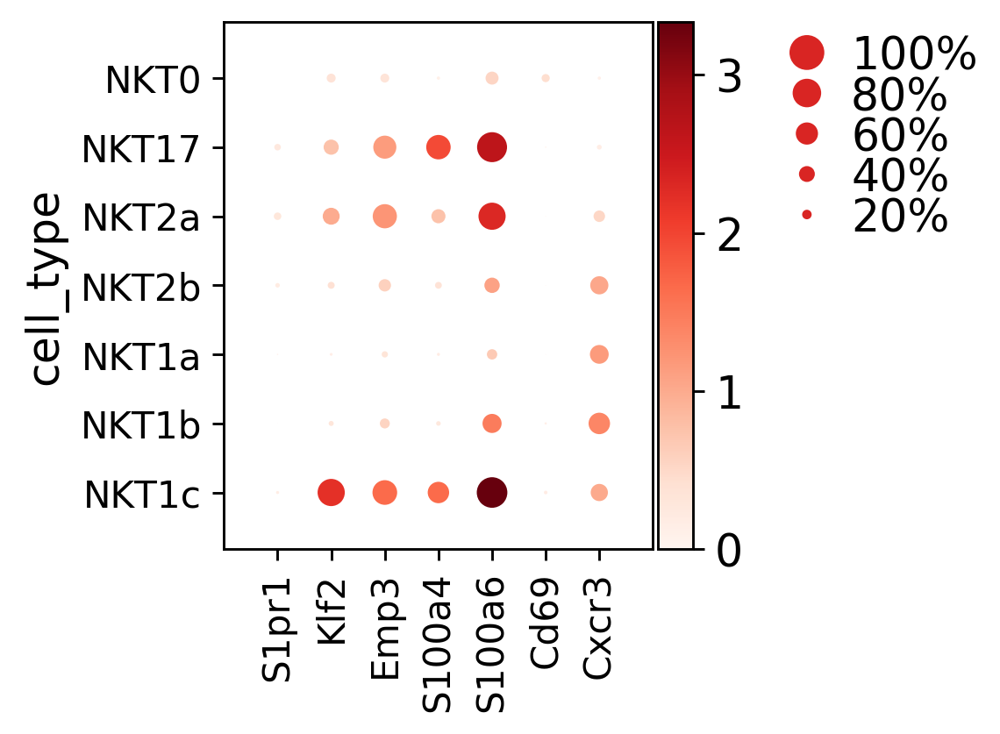

In [53]:
marker_genes = ['S1pr1', 'Klf2', 'Emp3', 'S100a4', 'S100a6', 'Cd69', 'Cxcr3']
ax = sc.pl.dotplot(wt, marker_genes, groupby='cell_type', save='fig.6a.pdf')

# Correlation heatmap

In [54]:
mean_cellType = np.empty((len(wt.obs['cell_type'].unique()), wt.raw.shape[1]), 
                           dtype=float, order='C')

In [55]:
raw_adata = wt.raw.X.toarray()

In [56]:
for i in range(0, len(wt.obs['cell_type'].unique())):
    #print(adata.obs['phenograph'].unique()[i])
    mean_cellType[i,:] = np.mean(raw_adata[wt.obs['cell_type'] == wt.obs['cell_type'].unique()[i], :], axis = 0)

In [57]:
mean_df = pd.DataFrame(np.corrcoef(mean_cellType), index = wt.obs['cell_type'].unique(), columns = wt.obs['cell_type'].unique())

DEBUG:matplotlib.colorbar:locator: <matplotlib.ticker.MaxNLocator object at 0x7f81e31ad810>
DEBUG:matplotlib.colorbar:Using auto colorbar locator on colorbar
DEBUG:matplotlib.colorbar:locator: <matplotlib.ticker.MaxNLocator object at 0x7f81e31ad810>
DEBUG:matplotlib.colorbar:Setting pcolormesh
DEBUG:matplotlib.backends.backend_pdf:Assigning font /b'F1' = '/home/lebrigand/.conda/envs/jupyter/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf'
DEBUG:matplotlib.backends.backend_pdf:Embedding font /home/lebrigand/.conda/envs/jupyter/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf.
DEBUG:matplotlib.backends.backend_pdf:Writing TrueType font.
DEBUG:matplotlib.backends.backend_pdf:Assigning font /b'F1' = '/home/lebrigand/.conda/envs/jupyter/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf'
DEBUG:matplotlib.backends.backend_pdf:Embedding font /home/lebrigand/.conda/envs/jupyter/lib/python3.7/site-packages/matplotlib/mpl-dat

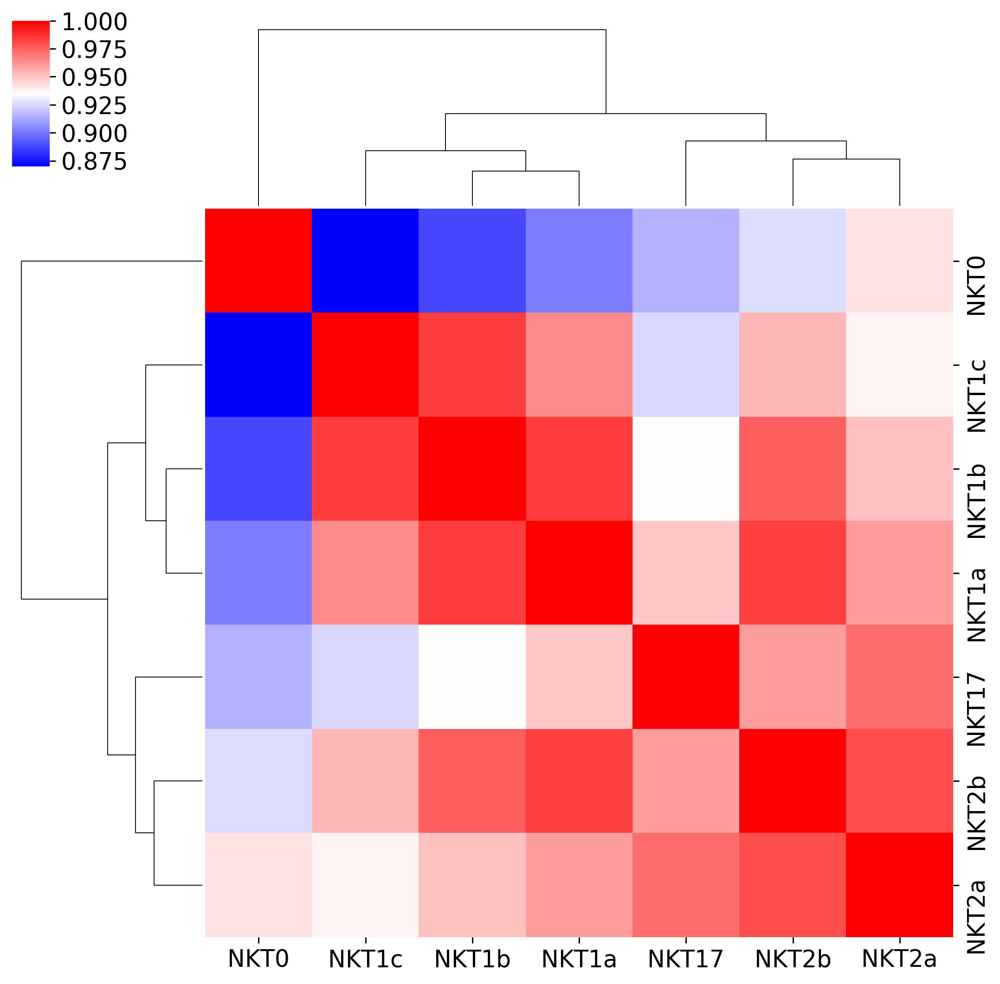

In [58]:
ax = sns.clustermap(mean_df, cmap="bwr")
ax.savefig("figure.6c.pdf")

# NKT2a versus NKT2b differential expression

In [59]:
wt = sc.read_h5ad('./output/wt.ann.h5ad')

cell_bool = []
for x in wt.obs['cell_type']:
    cell_bool = cell_bool + [x in ['NKT2a','NKT2b']]

In [60]:
list_of_cell_names = wt.obs.loc[cell_bool, :].index.tolist()
wt = wt[list_of_cell_names, ]
wt.shape

(650, 12958)

In [61]:
sc.tl.rank_genes_groups(wt, groupby='cell_type', key_added='group_DE_results', n_genes=200)

ranking genes
    finished: added to `.uns['group_DE_results']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


In [62]:
cell_type_nb = {}
list_cell_type = wt.obs['cell_type'].unique().tolist()
list_cell_type.sort()
for i in range(0, len(wt.obs['cell_type'].unique().tolist())):
    cell_type_nb[list_cell_type[i]] = i

#inverted_cell_type_nb = dict([[v,k] for k,v in cell_type_nb.items()])
#inverted_cell_type_nb

In [63]:
clusters = []
genes = []
logFC = []
score = []
pvals = []
pvals_adj = []

for cl in cell_type_nb.keys():
    clusters = clusters + ([cl]*len(wt.uns['group_DE_results']['names'][str(cl)]))
    genes = genes + wt.uns['group_DE_results']['names'][str(cl)].tolist()
    logFC = logFC + wt.uns['group_DE_results']['logfoldchanges'][str(cl)].tolist()
    score = score + wt.uns['group_DE_results']['scores'][str(cl)].tolist()
    pvals = pvals + wt.uns['group_DE_results']['pvals'][str(cl)].tolist()
    pvals_adj = pvals_adj + wt.uns['group_DE_results']['pvals_adj'][str(cl)].tolist()
    

In [64]:
markers = pd.DataFrame(data = {'clusters': clusters,
                              'genes':genes,
                              'logFC':logFC,
                              'score':score,
                              'pvals':pvals,
                              'pvals_adj':pvals_adj,
                              })

In [65]:
markers.to_csv(path_or_buf = 'nkt2.markers.csv', sep = ',', index = False)

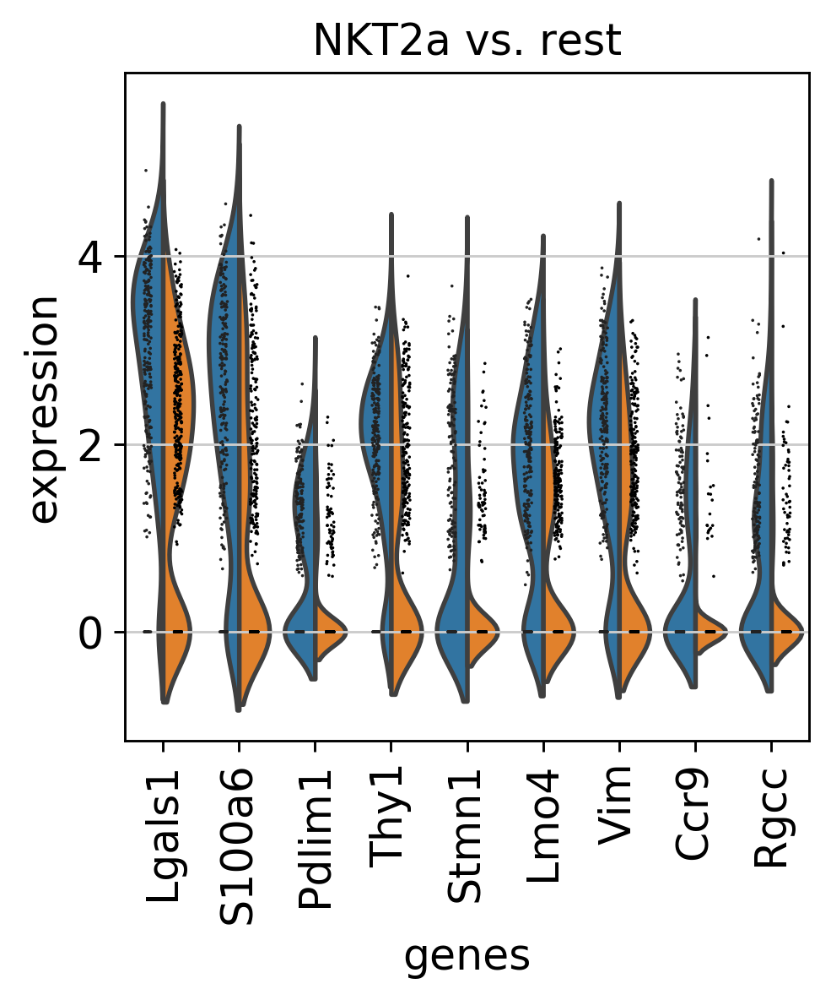

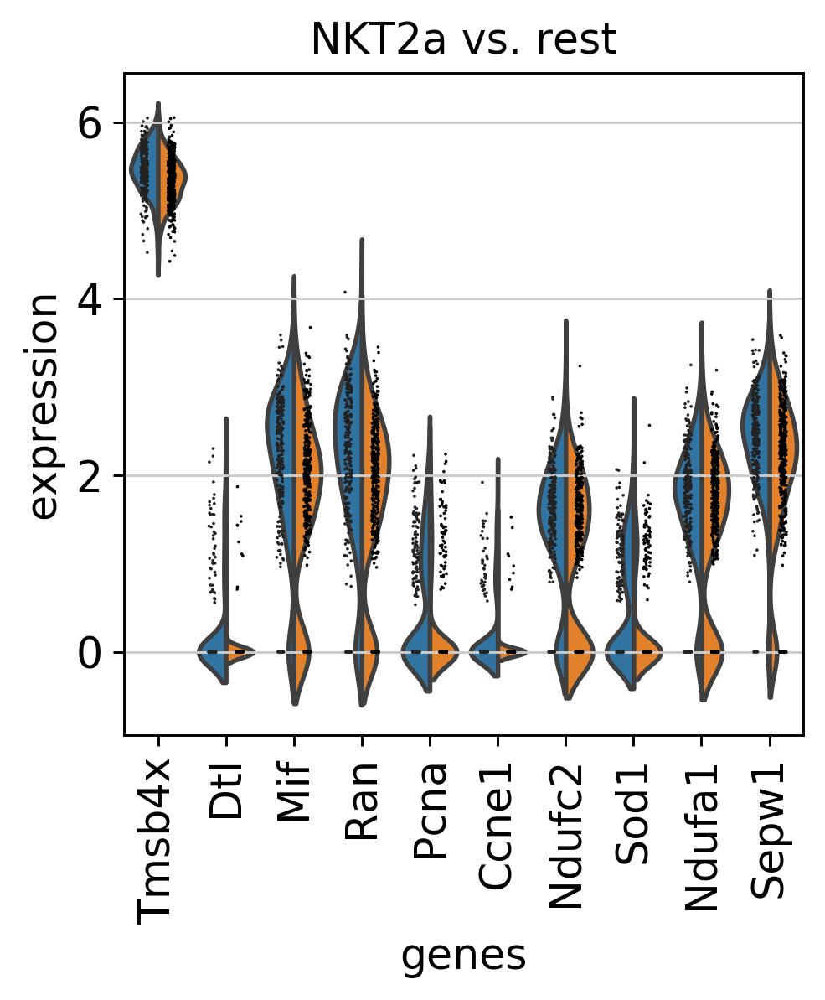

In [66]:
sc.pl.rank_genes_groups_violin(wt, use_raw=True, key='group_DE_results', groups=["NKT2a"], gene_names=wt.uns['group_DE_results']['names']["NKT2a"][1:10])
sc.pl.rank_genes_groups_violin(wt, use_raw=True, key='group_DE_results', groups=["NKT2a"], gene_names=wt.uns['group_DE_results']['names']["NKT2a"][90:100])

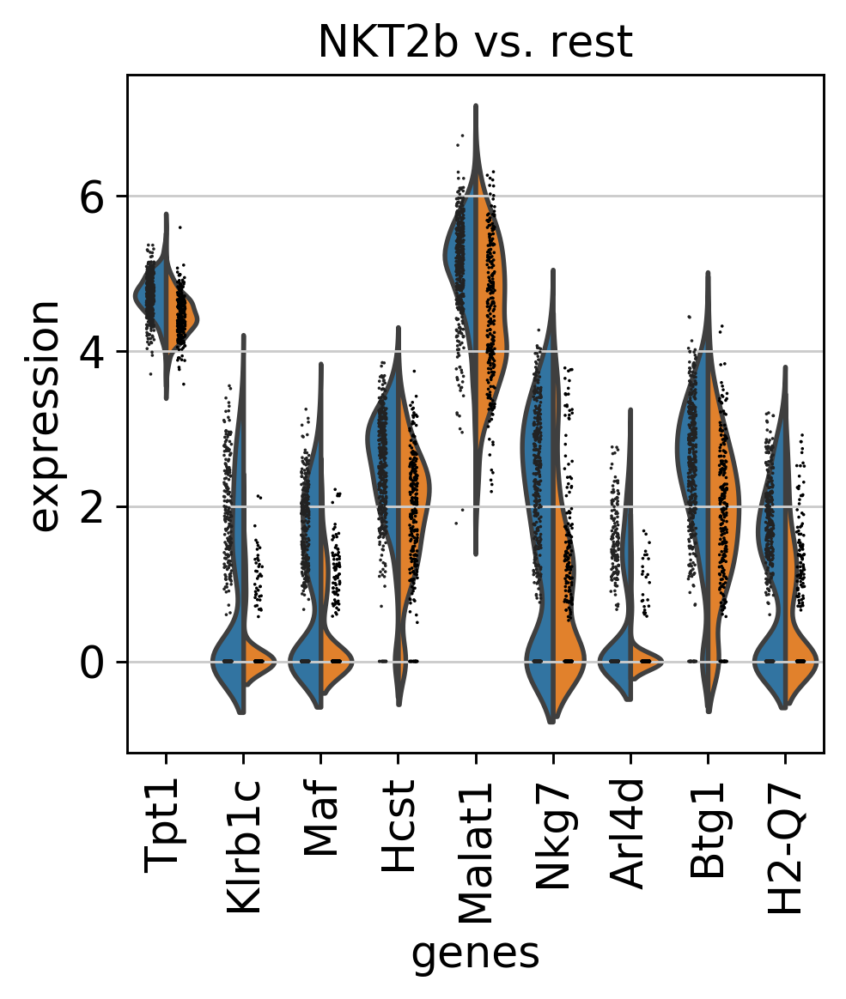

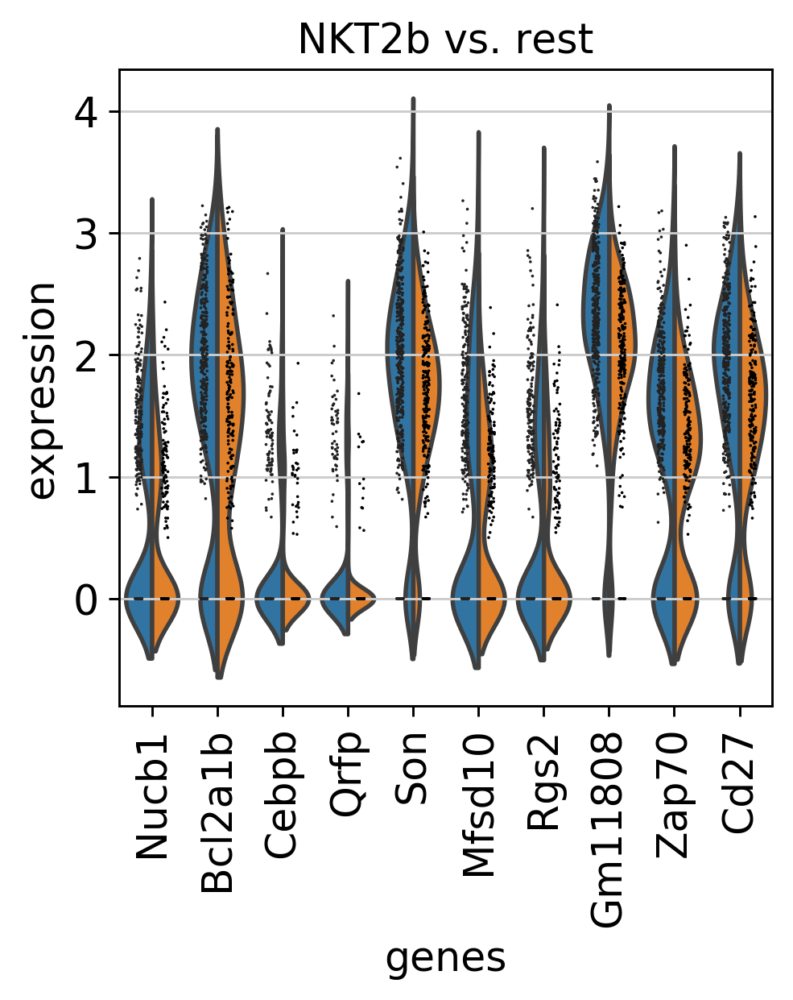

In [67]:
sc.pl.rank_genes_groups_violin(wt, use_raw=True, key='group_DE_results', groups=["NKT2b"], gene_names=wt.uns['group_DE_results']['names']["NKT2b"][1:10])
sc.pl.rank_genes_groups_violin(wt, use_raw=True, key='group_DE_results', groups=["NKT2b"], gene_names=wt.uns['group_DE_results']['names']["NKT2b"][90:100])

DEBUG:matplotlib.colorbar:locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f81e9724290>
DEBUG:matplotlib.colorbar:Using auto colorbar locator on colorbar
DEBUG:matplotlib.colorbar:locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f81e9724290>
DEBUG:matplotlib.colorbar:Setting pcolormesh


DEBUG:matplotlib.backends.backend_pdf:Assigning font /b'F1' = '/home/lebrigand/.conda/envs/jupyter/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf'
DEBUG:matplotlib.backends.backend_pdf:Embedding font /home/lebrigand/.conda/envs/jupyter/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf.
DEBUG:matplotlib.backends.backend_pdf:Writing TrueType font.
DEBUG:matplotlib.backends.backend_pdf:Assigning font /b'F1' = '/home/lebrigand/.conda/envs/jupyter/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf'
DEBUG:matplotlib.backends.backend_pdf:Embedding font /home/lebrigand/.conda/envs/jupyter/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf.
DEBUG:matplotlib.backends.backend_pdf:Writing TrueType font.


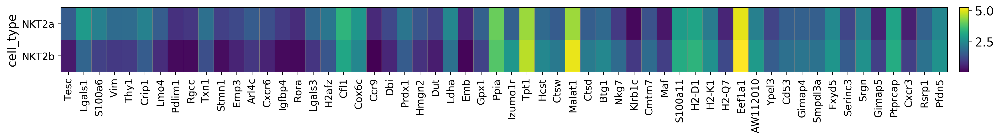

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[18.56, 0, 0.2])

In [68]:
nkt2_genes = ['Tesc','Lgals1','S100a6','Vim','Thy1','Crip1','Lmo4','Pdlim1','Rgcc','Txn1','Stmn1','Emp3','Arl4c','Cxcr6','Igfbp4','Rora','Lgals3','H2afz','Cfl1','Cox6c','Ccr9','Dbi','Prdx1','Hmgn2','Dut','Ldha','Emb','Gpx1','Ppia','Izumo1r','Tpt1','Hcst','Ctsw','Malat1','Ctsd','Btg1','Nkg7','Klrb1c','Cmtm7','Maf','S100a11','H2-D1','H2-K1','H2-Q7','Eef1a1','AW112010','Ypel3','Cd53','Gimap4','Smpdl3a','Fxyd5','Serinc3','Srgn','Gimap5','Ptprcap','Cxcr3','Rsrp1','Pfdn5']
sc.pl.matrixplot(wt, nkt2_genes, groupby='cell_type', save='figure.1sup.pdf')

DEBUG:matplotlib.colorbar:locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f81e9683f10>
DEBUG:matplotlib.colorbar:Using auto colorbar locator on colorbar
DEBUG:matplotlib.colorbar:locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f81e9683f10>
DEBUG:matplotlib.colorbar:Setting pcolormesh


DEBUG:matplotlib.backends.backend_pdf:Assigning font /b'F1' = '/home/lebrigand/.conda/envs/jupyter/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf'
DEBUG:matplotlib.backends.backend_pdf:Embedding font /home/lebrigand/.conda/envs/jupyter/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf.
DEBUG:matplotlib.backends.backend_pdf:Writing TrueType font.
DEBUG:matplotlib.backends.backend_pdf:Assigning font /b'F1' = '/home/lebrigand/.conda/envs/jupyter/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf'
DEBUG:matplotlib.backends.backend_pdf:Embedding font /home/lebrigand/.conda/envs/jupyter/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf.
DEBUG:matplotlib.backends.backend_pdf:Writing TrueType font.


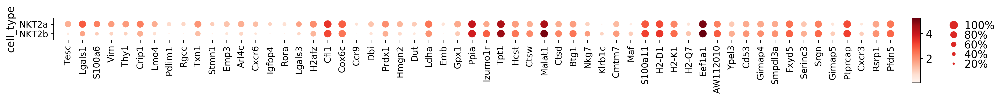

In [69]:
ax = sc.pl.dotplot(wt, nkt2_genes, groupby='cell_type', save='figure.1sup-2.pdf')

In [70]:
result = wt.uns['group_DE_results']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'logfoldchanges', 'scores', 'pvals']}).head(5)

,NKT2a_n,NKT2a_l,NKT2a_s,NKT2a_p,NKT2b_n,NKT2b_l,NKT2b_s,NKT2b_p
0,Tesc,2.765051,15.879553,9.811099e-46,Izumo1r,1.871054,16.851067,1.413060e-54
1,Lgals1,1.823903,10.764727,2.395907e-24,Tpt1,0.370118,13.555782,7.295400e-38
2,S100a6,2.206540,10.704684,3.669229e-24,Klrb1c,2.931841,12.950150,1.481613e-33
3,Pdlim1,2.397524,10.282739,2.837977e-22,Maf,1.912271,11.234000,5.604446e-27
4,Thy1,1.759850,10.084278,9.240712e-22,Hcst,1.018602,11.106052,9.363192e-27


DEBUG:matplotlib.colorbar:locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f81e3261750>
DEBUG:matplotlib.colorbar:Using auto colorbar locator on colorbar
DEBUG:matplotlib.colorbar:locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f81e3261750>
DEBUG:matplotlib.colorbar:Setting pcolormesh
DEBUG:matplotlib.colorbar:locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f81d9fb36d0>
DEBUG:matplotlib.colorbar:Using auto colorbar locator on colorbar
DEBUG:matplotlib.colorbar:locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f81d9fb36d0>
DEBUG:matplotlib.colorbar:Setting pcolormesh
DEBUG:matplotlib.colorbar:locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f81dc3c67d0>
DEBUG:matplotlib.colorbar:Using auto colorbar locator on colorbar
DEBUG:matplotlib.colorbar:locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f81dc3c67d0>
DEBUG:matplotlib.colorbar:Setting pcolormesh
DEBUG:matplotlib.colorbar:locator: <matplotlib.co

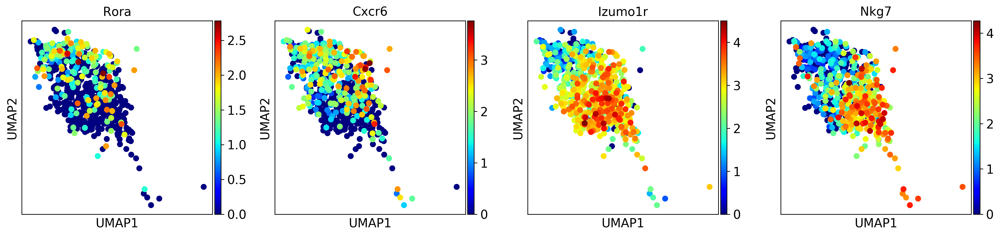

In [71]:
sc.pl.umap(wt, color=['Rora','Cxcr6','Izumo1r',"Nkg7"], color_map="jet") # NKT1